In [ ]:

# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES
# TO THE CORRECT LOCATION (/kaggle/input) IN YOUR NOTEBOOK,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.

import os
import sys
from tempfile import NamedTemporaryFile
from urllib.request import urlopen
from urllib.parse import unquote, urlparse
from urllib.error import HTTPError
from zipfile import ZipFile
import tarfile
import shutil

CHUNK_SIZE = 40960
DATA_SOURCE_MAPPING = 'uecfood100:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F894562%2F1517710%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240215%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240215T173015Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D3ff8721abced4e6fc6c63ee84cdfdd10531a79d8e7133a4073ce6c5fef23f50a119baad1e865c5618504c8a63cf7edaf7b9d87618476db0764ada6b85444456396549090d22e9f0565613ffd6f5c8ba243984915d477c585fa5fd2bb5396b0b90f75b5e959c24a3af79c4473e5d8a0c014480dbff3c3976e0d5d966027fc5c2a27234301f83a080422c6f453b1ac1874d7b9d6987c297aa6e7ea218ae1149a05461e9784a913e48343369b432ba3c2585b5bb65bfa6ca54d836f27a519eb0b871f83e4d9c403cd83f01cf1223bac33e7b30b54a2ee2a412205f1d9a27e5aa0426e79e4dabf43978a037a285a25f8f8533061fcc77f58ba7c29cc33a9d2b2c605,ymal111:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F4395709%2F7547582%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240215%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240215T173015Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D245d8f920724fffaeb2ca245ff8b7030153cd342d4bebbc8995f3c102394f7cbf800c2b9bb5748f7b04f722c20d9fbe94339f6ea9a0d8ceb251780311a3847c12a5d02a756ebd2c49d2ec1feecb98a250047153c0087da84bc2ac3136f51d6c9eb61531457aa3c07d88c8569a9adb4c6accdad81d56bfcd0fe8b65bdee3d7ec59ca7256ec3c97dd86c891788a47dd1a1689925dc5aa9352e5ad062346f27d1665445aa5dea036e6de93e7041348f1039b3cc7717b660c026411a80454f89df687e98052a17b1ed50252c7a03ec3eac945a6a8540fcb282754f8607b7be06dcc889e4e4e0f2fadd4980ed901b15d8c527bb64455f08900a93d617842229fc6d91'

KAGGLE_INPUT_PATH='/kaggle/input'
KAGGLE_WORKING_PATH='/kaggle/working'
KAGGLE_SYMLINK='kaggle'

!umount /kaggle/input/ 2> /dev/null
shutil.rmtree('/kaggle/input', ignore_errors=True)
os.makedirs(KAGGLE_INPUT_PATH, 0o777, exist_ok=True)
os.makedirs(KAGGLE_WORKING_PATH, 0o777, exist_ok=True)

try:
  os.symlink(KAGGLE_INPUT_PATH, os.path.join("..", 'input'), target_is_directory=True)
except FileExistsError:
  pass
try:
  os.symlink(KAGGLE_WORKING_PATH, os.path.join("..", 'working'), target_is_directory=True)
except FileExistsError:
  pass

for data_source_mapping in DATA_SOURCE_MAPPING.split(','):
    directory, download_url_encoded = data_source_mapping.split(':')
    download_url = unquote(download_url_encoded)
    filename = urlparse(download_url).path
    destination_path = os.path.join(KAGGLE_INPUT_PATH, directory)
    try:
        with urlopen(download_url) as fileres, NamedTemporaryFile() as tfile:
            total_length = fileres.headers['content-length']
            print(f'Downloading {directory}, {total_length} bytes compressed')
            dl = 0
            data = fileres.read(CHUNK_SIZE)
            while len(data) > 0:
                dl += len(data)
                tfile.write(data)
                done = int(50 * dl / int(total_length))
                sys.stdout.write(f"\r[{'=' * done}{' ' * (50-done)}] {dl} bytes downloaded")
                sys.stdout.flush()
                data = fileres.read(CHUNK_SIZE)
            if filename.endswith('.zip'):
              with ZipFile(tfile) as zfile:
                zfile.extractall(destination_path)
            else:
              with tarfile.open(tfile.name) as tarfile:
                tarfile.extractall(destination_path)
            print(f'\nDownloaded and uncompressed: {directory}')
    except HTTPError as e:
        print(f'Failed to load (likely expired) {download_url} to path {destination_path}')
        continue
    except OSError as e:
        print(f'Failed to load {download_url} to path {destination_path}')
        continue

print('Data source import complete.')


In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [1]:
import os
import random
from sklearn.model_selection import train_test_split
import pandas as pd
import warnings
warnings.filterwarnings('ignore')
from PIL import Image
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns


In [2]:
#get img_id & img_path & category name and id

data_path = "/kaggle/input/uecfood100/UECFOOD100"

data_list = []

category_file_path = os.path.join(data_path, "category.txt")
category_df = pd.read_csv(category_file_path, sep='\t', index_col='id')

if not category_df.empty:
    # loop through each folder
    for folder_id_str in os.listdir(data_path):
        try:
            folder_id = int(folder_id_str)
            folder_path = os.path.join(data_path, folder_id_str)
            if os.path.isdir(folder_path):
                # loop through imgs in each folder
                img_folder_path = folder_path
                for img_filename in os.listdir(img_folder_path):
                    if img_filename.endswith(".jpg"):

                        img_id = int(os.path.splitext(img_filename)[0])

                        img_path = os.path.join(img_folder_path, img_filename)#get img path

                        if folder_id in category_df.index:
                            category = category_df.loc[folder_id, 'name']
                            category_id = folder_id

                            data_list.append({
                                "img_id": img_id,
                                "img_path": img_path,
                                "category": category,
                                "category_id": category_id
                            })
        except ValueError:
            print(f"skip other folders: {folder_id_str}")

    data_df = pd.DataFrame(data_list)
    csv_output_path = "/kaggle/working/data_info.csv"
    data_df.to_csv(csv_output_path, index=False)


skip other folders: category_ja_sjis.txt
skip other folders: multiple_food.txt
skip other folders: category_ja_utf8.txt
skip other folders: category.txt
skip other folders: README.txt
skip other folders: category_ja_euc.txt


In [3]:
#get bounding box

csv_path = "/kaggle/working/data_info.csv"

data_df = pd.read_csv(csv_path)

# loop through each folder
for folder_id_str in os.listdir(data_path):
    try:
        folder_id = int(folder_id_str)
        folder_path = os.path.join(data_path, folder_id_str)
        if os.path.isdir(folder_path):
            # read bounding box
            bb_info_file_path = os.path.join(folder_path, "bb_info.txt")

            if os.path.exists(bb_info_file_path):
                try:
                          #create bb col
                          bb_info_df = pd.read_csv(bb_info_file_path, sep=' ', index_col=0, header=0, names=["x1", "y1", "x2", "y2"])

                          # loop through rows in bb_info_df
                          for img_id, bbox_info in bb_info_df.iterrows():
                            img_id = int(img_id)

                            pattern = f'/kaggle/input/uecfood100/UECFOOD100/{folder_id}/{img_id}.jpg'

                            matching_rows = data_df[data_df['img_path'] == pattern]

                            data_df.loc[matching_rows.index, ["x1", "y1", "x2", "y2"]] = [bbox_info["x1"], bbox_info["y1"], bbox_info["x2"], bbox_info["y2"]]

                except pd.errors.EmptyDataError:
                    print(f"No data found in {bb_info_file_path}")
    except ValueError:
        print(f"skip other folders: {folder_id_str}")

data_df.to_csv(csv_path, index=False)

skip other folders: category_ja_sjis.txt
skip other folders: multiple_food.txt
skip other folders: category_ja_utf8.txt
skip other folders: category.txt
skip other folders: README.txt
skip other folders: category_ja_euc.txt


In [4]:
data=pd.read_csv("/kaggle/working/data_info.csv")
data['category_id']=data['category_id']-1
# data['img_id'] = range(1, len(data) + 1)   #rename 

data.to_csv('/kaggle/working/data_info.csv', index=False)
data.head()

,img_id,img_path,category,category_id,x1,y1,x2,y2
0,623,/kaggle/input/uecfood100/UECFOOD100/7/623.jpg,sushi,6,0.0,0.0,540.0,241.0
1,654,/kaggle/input/uecfood100/UECFOOD100/7/654.jpg,sushi,6,0.0,31.0,200.0,129.0
2,14539,/kaggle/input/uecfood100/UECFOOD100/7/14539.jpg,sushi,6,0.0,75.0,800.0,570.0
3,646,/kaggle/input/uecfood100/UECFOOD100/7/646.jpg,sushi,6,23.0,42.0,258.0,197.0
4,682,/kaggle/input/uecfood100/UECFOOD100/7/682.jpg,sushi,6,5.0,0.0,449.0,307.0


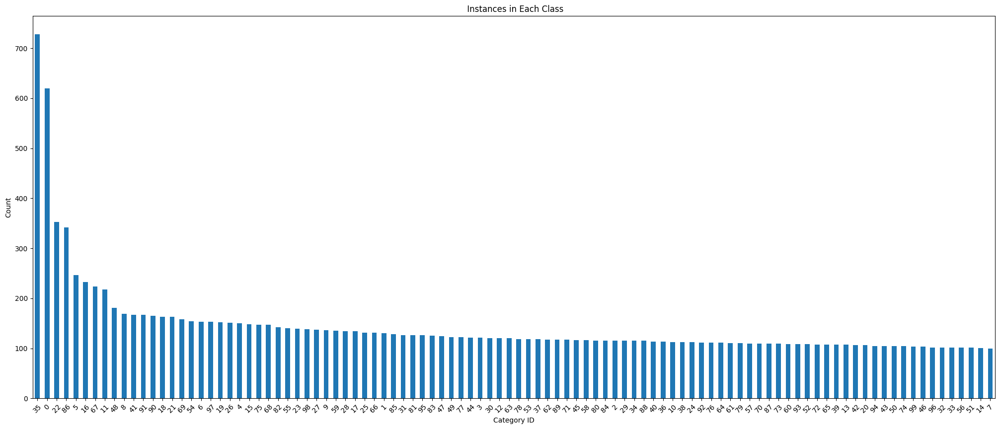

In [5]:
data=pd.read_csv('/kaggle/working/data_info.csv')
category_counts = data['category_id'].value_counts()

plt.figure(figsize=(25, 10))
category_counts.plot(kind='bar')
plt.title(' Instances in Each Class')
plt.xlabel('Category ID')
plt.ylabel('Count')
plt.xticks(rotation=45)

plt.show()

In [6]:
data=pd.read_csv("/kaggle/working/data_info.csv")

len(data) #14361
#35 >>700
#0>>600
#22>>300
#86>>300
#5>>200
#16>>200
#67>>200
#11>>200

14361

In [7]:
data = pd.read_csv('/kaggle/working/data_info.csv')

categories_and_samples = {
    0 : 450,
    35: 580,
    22: 190,
    86: 150,
    5 : 80,
    16: 50,
    67: 50,
    11: 50
}

for category_id, sample_size in categories_and_samples.items():
    zero_category_rows = data[data['category_id'] == category_id]
    rows_to_delete = random.sample(list(zero_category_rows.index), sample_size)
    data = data.drop(rows_to_delete)

data.to_csv('/kaggle/working/balanced.csv', index=False)


#     0: 450,
#     35: 580,
#     22: 190,
#     86: 150,
#     5: 80,
#     16: 50,
#     67: 50,
#     11: 50

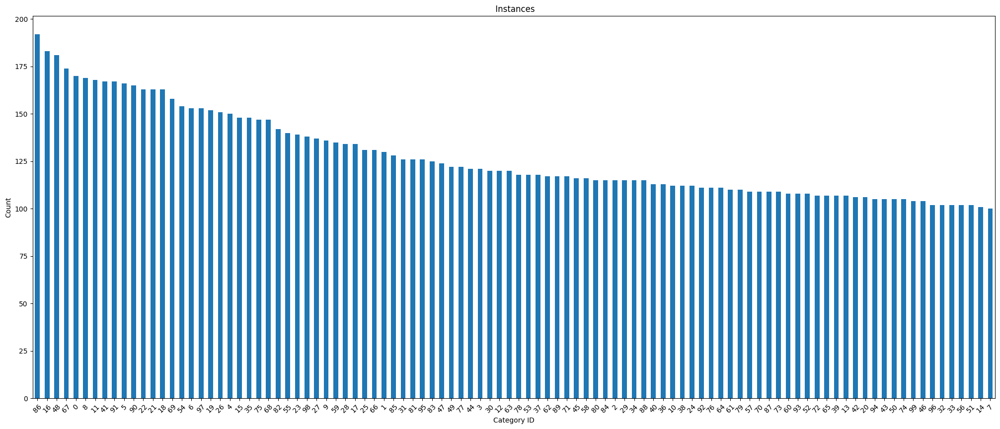

In [8]:
data=pd.read_csv('/kaggle/working/balanced.csv')
category_counts = data['category_id'].value_counts()

plt.figure(figsize=(25, 10))
category_counts.plot(kind='bar')
plt.title(' Instances')
plt.xlabel('Category ID')
plt.ylabel('Count')
plt.xticks(rotation=45)

plt.show()

In [9]:
n=pd.read_csv('/kaggle/working/balanced.csv')
len(n)#12761

12761

In [10]:
df = pd.read_csv('/kaggle/working/balanced.csv')

merged_df = df.groupby('img_id', as_index=False).agg({
    'img_path': 'first',
    'category': lambda x: ','.join(x),
    'category_id': lambda x: ','.join(map(str, x)),
    'x1': lambda x: ','.join(map(str, x)),
    'y1': lambda x: ','.join(map(str, x)),
    'x2': lambda x: ','.join(map(str, x)),
    'y2': lambda x: ','.join(map(str, x))
})

merged_df.to_csv('/kaggle/working/multiple_data.csv', index=False)


In [11]:
df = pd.read_csv("/kaggle/working/multiple_data.csv")
df.head(10)

,img_id,img_path,category,category_id,x1,y1,x2,y2
0,1,/kaggle/input/uecfood100/UECFOOD100/42/1.jpg,"jiaozi,rice","41,0","363.0,0.0","91.0,143.0","800.0,370.0","560.0,486.0"
1,3,/kaggle/input/uecfood100/UECFOOD100/1/3.jpg,rice,0,2.0,110.0,243.0,410.0
2,8,/kaggle/input/uecfood100/UECFOOD100/1/8.jpg,rice,0,80.0,31.0,776.0,454.0
3,9,/kaggle/input/uecfood100/UECFOOD100/24/9.jpg,beef noodle,23,278.0,76.0,798.0,509.0
4,10,/kaggle/input/uecfood100/UECFOOD100/1/10.jpg,rice,0,71.0,16.0,478.0,328.0
5,15,/kaggle/input/uecfood100/UECFOOD100/84/15.jpg,spaghetti meat sauce,83,578.0,221.0,798.0,370.0
6,16,/kaggle/input/uecfood100/UECFOOD100/99/16.jpg,mixed rice,98,0.0,4.0,436.0,354.0
7,19,/kaggle/input/uecfood100/UECFOOD100/70/19.jpg,"cold tofu,fermented soybeans,rice","69,68,0","181.0,365.0,352.0","183.0,86.0,135.0","305.0,483.0,500.0","300.0,167.0,326.0"
8,21,/kaggle/input/uecfood100/UECFOOD100/1/21.jpg,rice,0,8.0,5.0,456.0,285.0
9,22,/kaggle/input/uecfood100/UECFOOD100/70/22.jpg,"cold tofu,rolled omelet","69,66","250.0,155.0","35.0,185.0","370.0,291.0","120.0,278.0"


In [12]:

data_df = pd.read_csv("/kaggle/working/multiple_data.csv")

train_df, test_df = train_test_split(data_df, test_size=0.1, random_state=42)
train_df, val_df = train_test_split(train_df, test_size=0.2, random_state=42)

train_csv_path = "/kaggle/working/train_data.csv"
val_csv_path = "/kaggle/working/val_data.csv"
test_csv_path = "/kaggle/working/test_data.csv"

train_df.to_csv(train_csv_path, index=False)
val_df.to_csv(val_csv_path, index=False)
test_df.to_csv(test_csv_path, index=False)

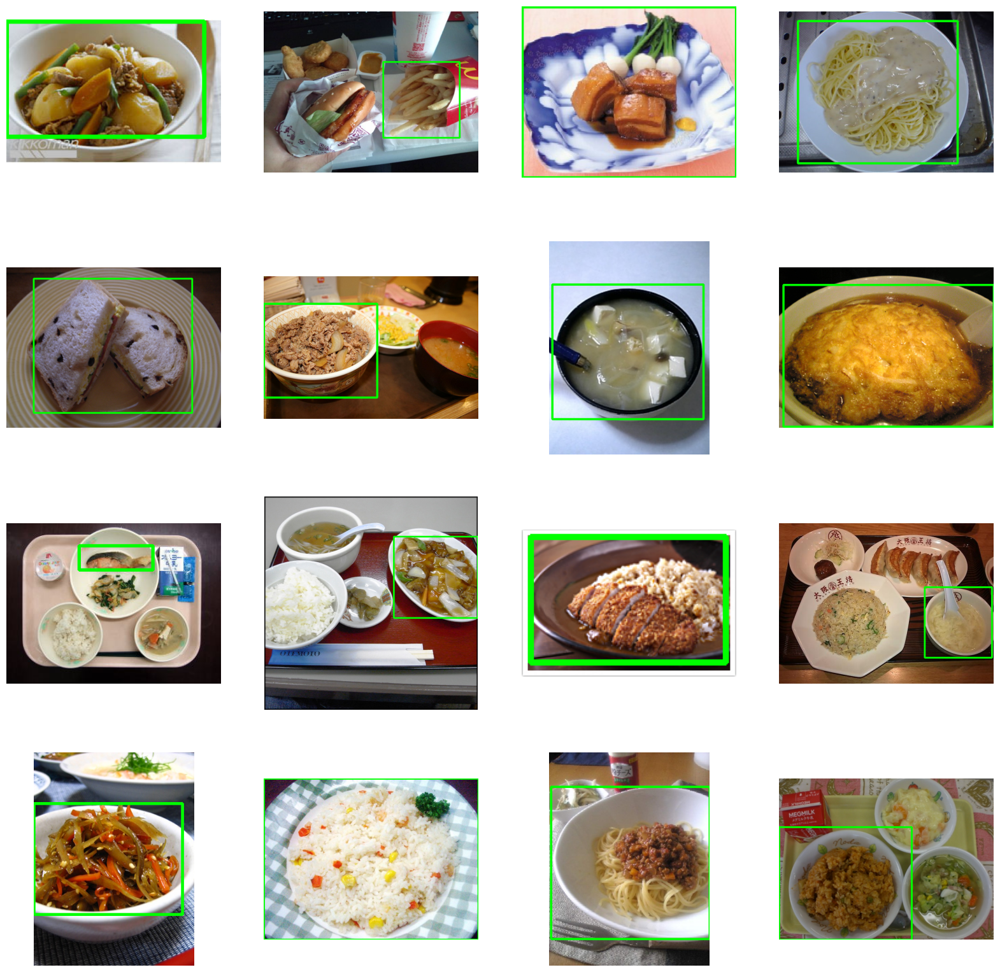

In [13]:
data_df = pd.read_csv("/kaggle/working/balanced.csv")


# Choose 16 random images from the dataframe
random_images = random.sample(range(len(data_df)), 16)

# Set up the plot with 4x4 grid
fig, axs = plt.subplots(4, 4, figsize=(20, 20))

for i, idx in enumerate(random_images):
    row = i // 4
    col = i % 4

    img_id = data_df.loc[idx, "img_id"]
    img_path = data_df.loc[idx, "img_path"]
    category_id = int(data_df.loc[idx, "category_id"])
    x1, y1, x2, y2 = int(data_df.loc[idx, "x1"]), int(data_df.loc[idx, "y1"]), int(data_df.loc[idx, "x2"]), int(data_df.loc[idx, "y2"])

    # Load the image
    img = cv2.imread(img_path)

    # Draw bounding box on the image
    cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 3)

    # Display the image with bounding box
    axs[row, col].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    axs[row, col].axis('off')

plt.show()

In [14]:
train_images = "/kaggle/working/new_data/train/images"
train_labels = "/kaggle/working/new_data/train/labels"

val_images = "/kaggle/working/new_data/val/images"
val_labels = "/kaggle/working/new_data/val/labels"

test_images = "/kaggle/working/new_data/test/images"
test_labels = "/kaggle/working/new_data/test/labels"

# train path

In [15]:
data_df = pd.read_csv("/kaggle/working/train_data.csv")

output_folder_path = "/kaggle/working/new_data/train"
os.makedirs(output_folder_path, exist_ok=True)

images_folder_path = os.path.join(output_folder_path, "images")
labels_folder_path = os.path.join(output_folder_path, "labels")
os.makedirs(images_folder_path, exist_ok=True)
os.makedirs(labels_folder_path, exist_ok=True)

def pascal_voc_to_yolo(x1, y1, x2, y2, image_w, image_h):
    x_center = (x1 + x2) / (2 * image_w)
    y_center = (y1 + y2) / (2 * image_h)
    width = (x2 - x1) / image_w
    height = (y2 - y1) / image_h
    return x_center, y_center, width, height

# Iterate over each row in the DataFrame
for _, row in data_df.iterrows():
    img_id = row["img_id"]
    img_path = row["img_path"]
    categories = row["category"].split(",")
    category_ids = [int(x) for x in str(row["category_id"]).split(",")]
    x1_values = [float(x) for x in str(row["x1"]).split(",")]
    y1_values = [float(x) for x in str(row["y1"]).split(",")]
    x2_values = [float(x) for x in str(row["x2"]).split(",")]
    y2_values = [float(x) for x in str(row["y2"]).split(",")]

    # Read and resize image
    img = cv2.imread(img_path)
    resized_img = cv2.resize(img, (640, 640))
    image_h, image_w, _ = resized_img.shape

    # Create a list to store records for each image
    image_records = []

    # Append records to the list
    for i in range(len(categories)):
        category_id = category_ids[i]
        x1, y1, x2, y2 = x1_values[i], y1_values[i], x2_values[i], y2_values[i]
        x_center, y_center, width, height = pascal_voc_to_yolo(x1, y1, x2, y2, img.shape[1], img.shape[0])
        record = f"{category_id} {x_center} {y_center} {width} {height}"
        image_records.append(record)

    # Write records to label text file
    label_filename = f"{img_id}.txt"
    label_destination_path = os.path.join(labels_folder_path, label_filename)
    with open(label_destination_path, "w") as label_file:
        for record in image_records:
            label_file.write(f"{record}\n")

    # Copy and resize images
    img_filename = f"{img_id}.jpg"
    img_destination_path = os.path.join(images_folder_path, img_filename)
    cv2.imwrite(img_destination_path, resized_img)


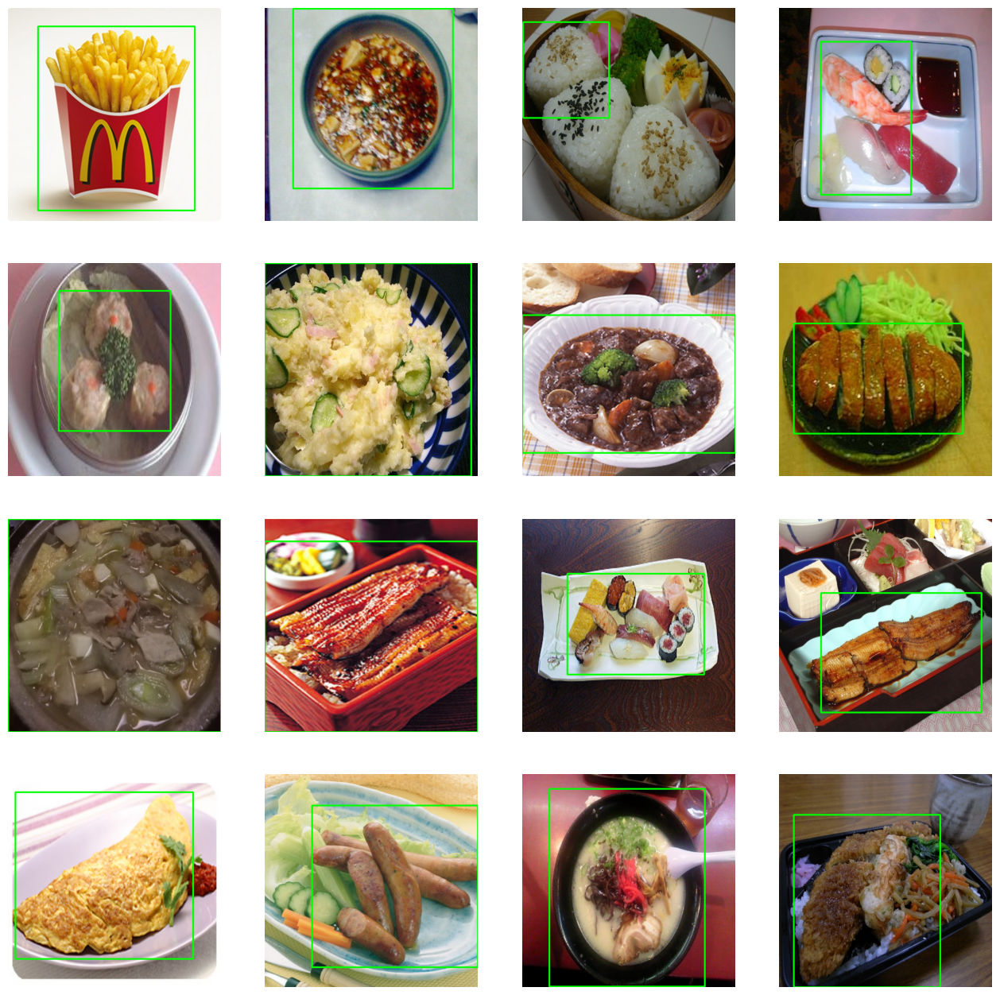

In [16]:
random_images = random.sample(os.listdir(train_images), 16)

fig, axs = plt.subplots(4, 4, figsize=(16, 16))

for i, image_file in enumerate(random_images):
    row = i // 4
    col = i % 4

    image_path = os.path.join(train_images, image_file)
    image = cv2.imread(image_path)

    # Load the labels for this image
    label_file = os.path.splitext(image_file)[0] + ".txt"
    label_path = os.path.join(train_labels, label_file)
    with open(label_path, "r") as f:
        labels = f.read().strip().split("\n")

    # Loop over the labels and plot the object detections
    for label in labels:
        if len(label.split()) != 5:
            continue

        class_id, x_center, y_center, width, height = map(float, label.split())

        x1 = int((x_center - width/2) * image.shape[1])
        y1 = int((y_center - height/2) * image.shape[0])
        x2 = int((x_center + width/2) * image.shape[1])
        y2 = int((y_center + height/2) * image.shape[0])
        # if i <= 2:
        #     print(label_file)
        #     print(label.split())
        #     print(class_id, x_center, y_center, width, height)
        #     print((x1, y1), (x2, y2), image.shape)
        cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 3)

    axs[row, col].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axs[row, col].axis('off')

plt.show()

# test path


In [17]:
data_df = pd.read_csv("/kaggle/working/test_data.csv")

output_folder_path = "/kaggle/working/new_data/test"
os.makedirs(output_folder_path, exist_ok=True)

images_folder_path = os.path.join(output_folder_path, "images")
labels_folder_path = os.path.join(output_folder_path, "labels")
os.makedirs(images_folder_path, exist_ok=True)
os.makedirs(labels_folder_path, exist_ok=True)

def pascal_voc_to_yolo(x1, y1, x2, y2, image_w, image_h):
    x_center = (x1 + x2) / (2 * image_w)
    y_center = (y1 + y2) / (2 * image_h)
    width = (x2 - x1) / image_w
    height = (y2 - y1) / image_h
    return x_center, y_center, width, height

# Iterate over each row in the DataFrame
for _, row in data_df.iterrows():
    img_id = row["img_id"]
    img_path = row["img_path"]
    categories = row["category"].split(",")
    category_ids = [int(x) for x in str(row["category_id"]).split(",")]
    x1_values = [float(x) for x in str(row["x1"]).split(",")]
    y1_values = [float(x) for x in str(row["y1"]).split(",")]
    x2_values = [float(x) for x in str(row["x2"]).split(",")]
    y2_values = [float(x) for x in str(row["y2"]).split(",")]

    # Read and resize image
    img = cv2.imread(img_path)
    resized_img = cv2.resize(img, (640, 640))
    image_h, image_w, _ = resized_img.shape

    # Create a list to store records for each image
    image_records = []

    # Append records to the list
    for i in range(len(categories)):
        category_id = category_ids[i]
        x1, y1, x2, y2 = x1_values[i], y1_values[i], x2_values[i], y2_values[i]
        x_center, y_center, width, height = pascal_voc_to_yolo(x1, y1, x2, y2, img.shape[1], img.shape[0])
        record = f"{category_id} {x_center} {y_center} {width} {height}"
        image_records.append(record)

    # Write records to label text file
    label_filename = f"{img_id}.txt"
    label_destination_path = os.path.join(labels_folder_path, label_filename)
    with open(label_destination_path, "w") as label_file:
        for record in image_records:
            label_file.write(f"{record}\n")

    # Copy and resize images
    img_filename = f"{img_id}.jpg"
    img_destination_path = os.path.join(images_folder_path, img_filename)
    cv2.imwrite(img_destination_path, resized_img)


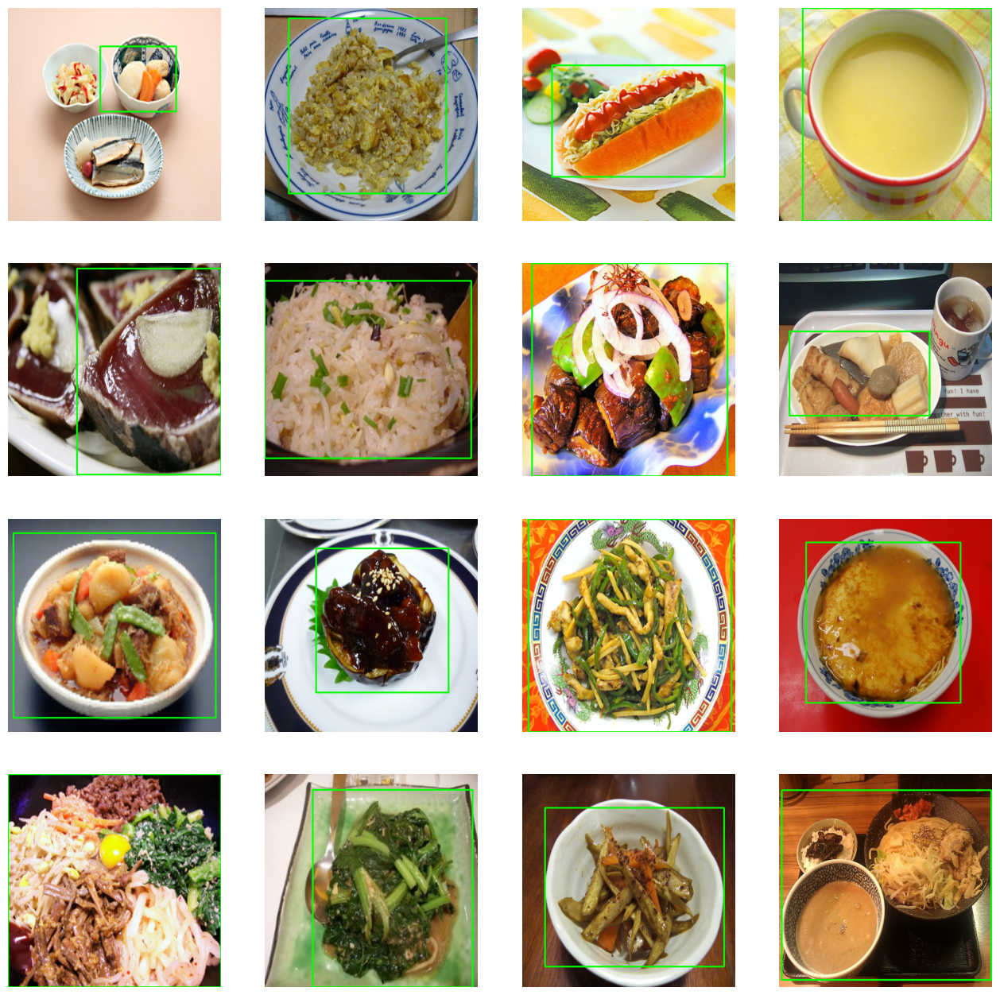

In [18]:
random.seed(42)

random_images = random.sample(os.listdir(test_images), 16)

fig, axs = plt.subplots(4, 4, figsize=(16, 16))

for i, image_file in enumerate(random_images):
    row = i // 4
    col = i % 4

    # Load the image
    image_path = os.path.join(test_images, image_file)
    image = cv2.imread(image_path)

    # Load the labels for this image
    label_file = os.path.splitext(image_file)[0] + ".txt"
    label_path = os.path.join(test_labels, label_file)
    with open(label_path, "r") as f:
        labels = f.read().strip().split("\n")

    # Loop over the labels and plot the object detections
    for label in labels:
        if len(label.split()) != 5:
            continue

        class_id, x_center, y_center, width, height = map(float, label.split())

        x1 = int((x_center - width/2) * image.shape[1])
        y1 = int((y_center - height/2) * image.shape[0])
        x2 = int((x_center + width/2) * image.shape[1])
        y2 = int((y_center + height/2) * image.shape[0])
#         if i <= 2:
#             print(class_id)
#             print(label_path)
#             print(label.split())
#             print((x1, y1), (x2, y2), image.shape)
        cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 3)

    # Show the image with bounding boxes
    axs[row, col].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axs[row, col].axis('off')

plt.show()

# val path

In [19]:
data_df = pd.read_csv("/kaggle/working/val_data.csv")

output_folder_path = "/kaggle/working/new_data/val"
os.makedirs(output_folder_path, exist_ok=True)

images_folder_path = os.path.join(output_folder_path, "images")
labels_folder_path = os.path.join(output_folder_path, "labels")
os.makedirs(images_folder_path, exist_ok=True)
os.makedirs(labels_folder_path, exist_ok=True)

def pascal_voc_to_yolo(x1, y1, x2, y2, image_w, image_h):
    x_center = (x1 + x2) / (2 * image_w)
    y_center = (y1 + y2) / (2 * image_h)
    width = (x2 - x1) / image_w
    height = (y2 - y1) / image_h
    return x_center, y_center, width, height

# Iterate over each row in the DataFrame
for _, row in data_df.iterrows():
    img_id = row["img_id"]
    img_path = row["img_path"]
    categories = row["category"].split(",")
    category_ids = [int(x) for x in str(row["category_id"]).split(",")]
    x1_values = [float(x) for x in str(row["x1"]).split(",")]
    y1_values = [float(x) for x in str(row["y1"]).split(",")]
    x2_values = [float(x) for x in str(row["x2"]).split(",")]
    y2_values = [float(x) for x in str(row["y2"]).split(",")]

    # Read and resize image
    img = cv2.imread(img_path)
    resized_img = cv2.resize(img, (640, 640))
    image_h, image_w, _ = resized_img.shape

    # Create a list to store records for each image
    image_records = []

    # Append records to the list
    for i in range(len(categories)):
        category_id = category_ids[i]
        x1, y1, x2, y2 = x1_values[i], y1_values[i], x2_values[i], y2_values[i]
        x_center, y_center, width, height = pascal_voc_to_yolo(x1, y1, x2, y2, img.shape[1], img.shape[0])
        record = f"{category_id} {x_center} {y_center} {width} {height}"
        image_records.append(record)

    # Write records to label text file
    label_filename = f"{img_id}.txt"
    label_destination_path = os.path.join(labels_folder_path, label_filename)
    with open(label_destination_path, "w") as label_file:
        for record in image_records:
            label_file.write(f"{record}\n")

    # Copy and resize images
    img_filename = f"{img_id}.jpg"
    img_destination_path = os.path.join(images_folder_path, img_filename)
    cv2.imwrite(img_destination_path, resized_img)


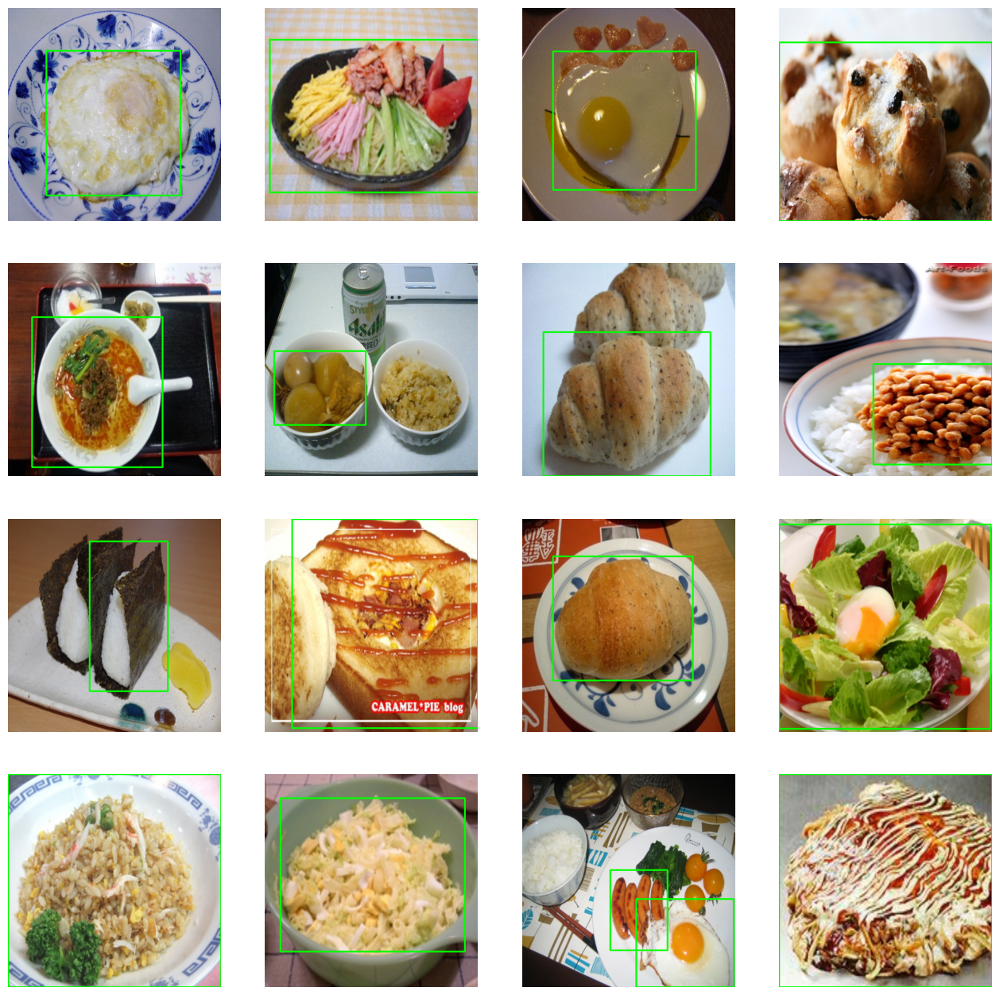

In [20]:

random_images = random.sample(os.listdir(val_images), 16)

fig, axs = plt.subplots(4, 4, figsize=(16, 16))

for i, image_file in enumerate(random_images):
    row = i // 4
    col = i % 4

    # Load the image
    image_path = os.path.join(val_images, image_file)
    image = cv2.imread(image_path)

    # Load the labels for this image
    label_file = os.path.splitext(image_file)[0] + ".txt"
    label_path = os.path.join(val_labels, label_file)
    with open(label_path, "r") as f:
        labels = f.read().strip().split("\n")

    # Loop over the labels and plot the object detections
    for label in labels:
        if len(label.split()) != 5:
            continue

        class_id, x_center, y_center, width, height = map(float, label.split())

        x1 = int((x_center - width/2) * image.shape[1])
        y1 = int((y_center - height/2) * image.shape[0])
        x2 = int((x_center + width/2) * image.shape[1])
        y2 = int((y_center + height/2) * image.shape[0])
#         if i <= 2:
#             print(class_id)
#             print(label_path)
#             print(label.split())
#             print((x1, y1), (x2, y2), image.shape)
        cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 3)

    # Show the image with bounding boxes
    axs[row, col].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axs[row, col].axis('off')

plt.show()

In [ ]:
# import os
# import shutil

# working_directory = '/kaggle/working/new_data/test'

# shutil.make_archive('/kaggle/working/test', 'zip', working_directory)

In [ ]:
# #for ymal
# number_list = [i for i in range(100)]
# print(number_list)

In [21]:
%pip install ultralytics
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.3/40.3 kB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 723.1/723.1 kB 25.1 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [22]:
from ultralytics import YOLO

In [26]:
train_data = os.listdir(train_images)

train_image_file_paths = [os.path.join(train_images,i) for i in train_data if '.jpg' in i]
len(train_image_file_paths)

8640

In [23]:
val_data = os.listdir(val_images)

val_image_file_paths = [os.path.join(val_images,i) for i in val_data if '.jpg' in i]
len(val_image_file_paths)

2161

In [24]:
test_data = os.listdir(test_images)

test_image_file_paths = [os.path.join(test_images,i) for i in test_data if '.jpg' in i]
len(test_image_file_paths)

1201

In [25]:
model = YOLO('yolov8m.pt')

model.train(data = '/kaggle/input/100-string/100_ymal.yaml',
            #bbox_format='xyxy',
            epochs = 100,
            imgsz = 640,
            seed = 42,
            patience=20,
            save=True,
            batch = 30,
            workers = 4)

100%|██████████| 49.7M/49.7M [00:00<00:00, 284MB/s]


Ultralytics YOLOv8.1.37 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/kaggle/input/100-string/100_ymal.yaml, epochs=100, time=None, patience=20, batch=30, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=4, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=42, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, sh

100%|██████████| 755k/755k [00:00<00:00, 39.2MB/s]
2024-03-30 14:47:45,927	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-03-30 14:47:46,775	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-03-30 14:47:49.370851: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-30 14:47:49.370981: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-30 14:47:49.504215: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS facto

Overriding model.yaml nc=80 with nc=100

                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1  1   1991808  ultralyti

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

  ········································


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLOv8n...


100%|██████████| 6.23M/6.23M [00:00<00:00, 164MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/working/new_data/train/labels... 8642 images, 0 backgrounds, 43 corrupt: 100%|██████████| 8642/8642 [00:07<00:00, 1211.24it/s]

train: WARNING ⚠️ /kaggle/working/new_data/train/images/10784.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.4045]
train: WARNING ⚠️ /kaggle/working/new_data/train/images/10787.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.5655]
train: WARNING ⚠️ /kaggle/working/new_data/train/images/10866.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.2833]
train: WARNING ⚠️ /kaggle/working/new_data/train/images/10871.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [      1.325]
train: WARNING ⚠️ /kaggle/working/new_data/train/images/10880.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0833]
train: WARNING ⚠️ /kaggle/working/new_data/train/images/11109.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.3194]
train: WARNING ⚠️ /kaggle/working/new_data/train/images/11170.jpg: ign

train: New cache created: /kaggle/working/new_data/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /kaggle/working/new_data/val/labels... 2161 images, 0 backgrounds, 11 corrupt: 100%|██████████| 2161/2161 [00:01<00:00, 1510.85it/s]

val: WARNING ⚠️ /kaggle/working/new_data/val/images/10770.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.3933]
val: WARNING ⚠️ /kaggle/working/new_data/val/images/10870.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.1972]
val: WARNING ⚠️ /kaggle/working/new_data/val/images/10947.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.3333]
val: WARNING ⚠️ /kaggle/working/new_data/val/images/11227.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.3278]
val: WARNING ⚠️ /kaggle/working/new_data/val/images/12776.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.3118]
val: WARNING ⚠️ /kaggle/working/new_data/val/images/14510.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0583]
val: WARNING ⚠️ /kaggle/working/new_data/val/images/1518.jpg: ignoring corrupt image/label: no

val: New cache created: /kaggle/working/new_data/val/labels.cache
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.00046875), 83 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      14.4G     0.8918      4.008      1.483         47        640: 100%|██████████| 287/287 [05:09<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:31<00:00,  1.16it/s]


                   all       2150       2294      0.297      0.344      0.231      0.157

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      14.6G      0.849      2.656      1.409         56        640: 100%|██████████| 287/287 [05:05<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.21it/s]


                   all       2150       2294      0.367      0.303      0.241      0.161

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      14.6G     0.9264      2.574       1.47         50        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.21it/s]


                   all       2150       2294      0.267      0.284      0.174      0.105

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      14.6G      1.018      2.719      1.527         48        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.21it/s]


                   all       2150       2294      0.325      0.257      0.192       0.12

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      14.6G     0.9888      2.542      1.502         56        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.21it/s]


                   all       2150       2294      0.268      0.312      0.223      0.144

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      14.6G     0.9718      2.399      1.481         59        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.21it/s]


                   all       2150       2294      0.289      0.299       0.24      0.157

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      14.6G     0.9405      2.259      1.458         47        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.21it/s]


                   all       2150       2294      0.385      0.444      0.387      0.261

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      14.6G     0.9086      2.171       1.44         46        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.21it/s]

                   all       2150       2294      0.412      0.469      0.426      0.285



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      14.6G     0.8994      2.066      1.432         51        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.21it/s]

                   all       2150       2294       0.44       0.47      0.436      0.293



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      14.6G     0.8899      1.988      1.418         58        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.20it/s]

                   all       2150       2294      0.453      0.476       0.47       0.33



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      14.6G     0.8718      1.911      1.408         54        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.21it/s]

                   all       2150       2294      0.461      0.483      0.477      0.319



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      14.6G     0.8665      1.878      1.404         56        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.21it/s]

                   all       2150       2294      0.546      0.533      0.558      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      14.6G     0.8566      1.809      1.397         47        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.21it/s]

                   all       2150       2294      0.523      0.531      0.547      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      14.6G     0.8366      1.759      1.381         54        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.21it/s]

                   all       2150       2294       0.55      0.497      0.551      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      14.6G     0.8346      1.739      1.379         63        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.21it/s]

                   all       2150       2294      0.499      0.548      0.539      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      14.6G     0.8259      1.684      1.374         51        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.21it/s]

                   all       2150       2294      0.564       0.58      0.609      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      14.6G     0.8181       1.63      1.365         52        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.20it/s]

                   all       2150       2294      0.599      0.608      0.639       0.46



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      14.6G     0.8096      1.593      1.362         48        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.21it/s]

                   all       2150       2294      0.602      0.587      0.619      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      14.6G     0.7924      1.566      1.355         57        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.21it/s]

                   all       2150       2294      0.577      0.598      0.619      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      14.6G      0.791      1.514      1.344         51        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.21it/s]

                   all       2150       2294       0.62      0.573      0.627      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      14.6G     0.7807      1.508      1.337         52        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.21it/s]

                   all       2150       2294      0.627      0.605      0.671      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      14.6G     0.7853       1.47       1.34         58        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.21it/s]

                   all       2150       2294      0.617      0.642      0.673      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      14.6G      0.773      1.436      1.336         54        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.21it/s]

                   all       2150       2294      0.652      0.618      0.688      0.494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      14.6G     0.7707      1.418      1.331         47        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.21it/s]

                   all       2150       2294      0.662      0.651      0.698      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      14.6G     0.7577       1.39      1.322         55        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.21it/s]

                   all       2150       2294      0.635      0.637      0.676      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      14.6G     0.7582      1.366      1.326         55        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.21it/s]

                   all       2150       2294       0.64      0.644      0.689      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      14.6G     0.7482      1.327      1.311         47        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.21it/s]

                   all       2150       2294      0.644      0.632      0.693      0.505



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      14.6G      0.743      1.326      1.313         54        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.22it/s]

                   all       2150       2294      0.669      0.649      0.711      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      14.6G     0.7436      1.287      1.311         56        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.21it/s]

                   all       2150       2294      0.659      0.647      0.705      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      14.6G     0.7366      1.264      1.307         52        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.21it/s]

                   all       2150       2294      0.694       0.65       0.72      0.525



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      14.6G     0.7324      1.252      1.299         40        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.21it/s]

                   all       2150       2294      0.664      0.672      0.716      0.527



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      14.6G      0.727      1.237      1.295         55        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.21it/s]

                   all       2150       2294      0.656      0.688      0.729      0.541



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      14.6G     0.7283      1.217      1.296         50        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.21it/s]

                   all       2150       2294      0.673      0.679      0.729       0.54



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      14.6G     0.7147      1.199      1.287         66        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.21it/s]

                   all       2150       2294      0.713      0.667      0.733      0.543



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      14.6G     0.7128       1.16      1.287         48        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.21it/s]

                   all       2150       2294        0.7      0.677      0.743      0.551



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      14.6G     0.7039      1.141       1.28         55        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.21it/s]

                   all       2150       2294      0.703      0.694      0.751      0.556



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      14.6G     0.7058      1.143      1.281         52        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.21it/s]

                   all       2150       2294      0.715      0.686      0.756      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      14.6G     0.6952      1.132      1.275         53        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.21it/s]

                   all       2150       2294      0.724      0.682      0.753      0.557



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      14.6G     0.6949      1.091      1.273         54        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.21it/s]

                   all       2150       2294      0.716      0.709      0.759      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      14.6G     0.6946      1.092      1.267         53        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.21it/s]

                   all       2150       2294      0.723      0.679      0.756      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      14.6G      0.689      1.083      1.265         59        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.21it/s]

                   all       2150       2294      0.736      0.695       0.77      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      14.6G     0.6848      1.048      1.264         51        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.21it/s]

                   all       2150       2294      0.715      0.709      0.766       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      14.6G     0.6698      1.028      1.253         51        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.22it/s]

                   all       2150       2294      0.743      0.695      0.771      0.577



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      14.6G     0.6752      1.027      1.258         43        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.21it/s]

                   all       2150       2294      0.728      0.723      0.772      0.583



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      14.6G     0.6648      1.009      1.248         49        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.21it/s]

                   all       2150       2294      0.747       0.71      0.774       0.58



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      14.6G     0.6555     0.9994       1.24         56        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.21it/s]

                   all       2150       2294      0.748      0.708      0.777      0.583



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      14.6G     0.6521     0.9755      1.237         59        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.22it/s]

                   all       2150       2294      0.737      0.701      0.773      0.577



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      14.6G     0.6605     0.9704      1.244         52        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.22it/s]

                   all       2150       2294       0.71      0.745      0.781      0.585



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      14.6G     0.6463      0.956      1.232         55        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.22it/s]

                   all       2150       2294      0.729      0.733      0.785       0.59



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      14.6G     0.6419     0.9313      1.231         62        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.22it/s]

                   all       2150       2294      0.711      0.746      0.784      0.594



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      14.6G      0.636     0.9253      1.224         48        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.21it/s]

                   all       2150       2294      0.758      0.702      0.781      0.587



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      14.6G     0.6289     0.9197      1.218         42        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.21it/s]

                   all       2150       2294      0.757      0.703      0.783      0.591



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      14.6G     0.6191     0.8837      1.212         63        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.22it/s]

                   all       2150       2294      0.716      0.748      0.788      0.596



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      14.6G     0.6157     0.8962       1.21         53        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.21it/s]

                   all       2150       2294      0.734      0.738      0.782       0.59



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      14.6G     0.6131      0.877      1.205         46        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.21it/s]

                   all       2150       2294       0.75      0.731      0.789      0.597



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      14.6G     0.6122     0.8642      1.204         55        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.22it/s]

                   all       2150       2294      0.754      0.731      0.796        0.6



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      14.6G     0.6143     0.8539      1.207         51        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.22it/s]

                   all       2150       2294      0.759       0.72      0.791      0.594



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      14.6G      0.599     0.8435      1.194         42        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.22it/s]

                   all       2150       2294       0.76      0.725      0.794      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      14.6G     0.5979     0.8334      1.197         44        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.22it/s]

                   all       2150       2294      0.776      0.721      0.798      0.601



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      14.6G     0.5933     0.8064      1.193         45        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.22it/s]

                   all       2150       2294      0.737      0.746      0.794        0.6



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      14.6G     0.5877     0.8126       1.19         49        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.22it/s]

                   all       2150       2294      0.753      0.744      0.795      0.604



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      14.6G     0.5866     0.8023      1.188         53        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.21it/s]

                   all       2150       2294      0.734      0.755      0.796      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      14.6G     0.5859     0.7903      1.187         38        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.21it/s]

                   all       2150       2294      0.748      0.748      0.795      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      14.6G     0.5772      0.769      1.176         57        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.22it/s]

                   all       2150       2294      0.758      0.739      0.796      0.602



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      14.6G     0.5706     0.7616      1.175         54        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.22it/s]

                   all       2150       2294      0.773       0.73      0.796      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      14.6G     0.5638     0.7409      1.165         51        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.22it/s]

                   all       2150       2294      0.766      0.733      0.794      0.601



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      14.6G     0.5609     0.7383      1.165         53        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.21it/s]

                   all       2150       2294      0.758      0.733      0.796      0.602



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      14.6G     0.5565     0.7312      1.161         55        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.22it/s]

                   all       2150       2294      0.756      0.734      0.791      0.599



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      14.6G     0.5482     0.7229      1.154         52        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.21it/s]

                   all       2150       2294      0.762      0.732      0.795      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      14.6G     0.5488      0.712      1.157         48        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.22it/s]

                   all       2150       2294      0.749      0.731      0.797      0.605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      14.6G     0.5412     0.6984      1.151         54        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.22it/s]

                   all       2150       2294       0.74      0.746      0.797      0.604



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      14.6G     0.5374     0.6981      1.147         39        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.22it/s]

                   all       2150       2294      0.746      0.752      0.797      0.605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      14.6G     0.5309     0.6816      1.143         55        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.22it/s]

                   all       2150       2294      0.749      0.747      0.797      0.604



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      14.6G     0.5305     0.6778      1.145         57        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.22it/s]

                   all       2150       2294       0.74      0.759      0.797      0.606



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      14.6G      0.524     0.6797       1.14         50        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.22it/s]

                   all       2150       2294      0.749      0.748      0.797      0.607



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      14.6G     0.5183     0.6526      1.141         56        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.22it/s]

                   all       2150       2294      0.759      0.746        0.8      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      14.6G     0.5104     0.6566      1.127         55        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.22it/s]

                   all       2150       2294       0.75      0.748      0.798      0.607



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      14.6G     0.5127     0.6447       1.13         44        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.22it/s]

                   all       2150       2294      0.746      0.751      0.797      0.606



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      14.6G     0.5013     0.6296      1.125         53        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.22it/s]

                   all       2150       2294      0.743      0.745      0.796      0.605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      14.6G     0.5018      0.619      1.123         50        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.22it/s]

                   all       2150       2294       0.76      0.732      0.801      0.607



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      14.6G     0.4978     0.6212      1.123         51        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.22it/s]

                   all       2150       2294      0.742       0.75      0.801      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      14.6G     0.4927     0.6111      1.117         51        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.22it/s]

                   all       2150       2294      0.737      0.747      0.799      0.607



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      14.6G     0.4874     0.6082      1.116         48        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.22it/s]

                   all       2150       2294       0.74      0.743      0.799      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      14.6G     0.4765     0.5834      1.107         56        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.22it/s]

                   all       2150       2294      0.748      0.738      0.797      0.607



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      14.6G     0.4781     0.5951      1.109         51        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.22it/s]

                   all       2150       2294      0.718      0.763      0.797      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      14.6G     0.4723     0.5805      1.104         43        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.22it/s]

                   all       2150       2294      0.745      0.737      0.798      0.609



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      14.6G     0.4664     0.5702        1.1         56        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.22it/s]

                   all       2150       2294       0.76      0.725      0.797      0.606



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      14.6G     0.4694     0.5763      1.103         47        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.22it/s]

                   all       2150       2294      0.768       0.72      0.796      0.606



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      14.6G     0.4621     0.5601      1.098         57        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.22it/s]

                   all       2150       2294      0.766      0.724      0.797      0.605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      14.6G     0.4576     0.5548      1.096         52        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.22it/s]

                   all       2150       2294      0.768      0.726      0.797      0.604


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      14.6G     0.3441     0.2988      1.063         21        640: 100%|██████████| 287/287 [05:05<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.21it/s]

                   all       2150       2294      0.762      0.733      0.796      0.604



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      14.6G      0.327     0.2738      1.049         20        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.22it/s]

                   all       2150       2294      0.762      0.734      0.796      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      14.6G     0.3189      0.258      1.039         20        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.22it/s]

                   all       2150       2294      0.772      0.726      0.796      0.604



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      14.6G     0.3115     0.2528      1.038         21        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.22it/s]

                   all       2150       2294      0.755      0.741      0.798      0.604



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      14.6G     0.3045     0.2484      1.028         19        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.22it/s]

                   all       2150       2294      0.761      0.738      0.799      0.605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      14.6G        0.3     0.2379      1.027         21        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.22it/s]

                   all       2150       2294      0.768       0.73      0.797      0.605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      14.6G     0.2913     0.2296      1.014         20        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.22it/s]

                   all       2150       2294      0.779      0.723      0.798      0.605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      14.6G     0.2857     0.2214      1.011         21        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.21it/s]

                   all       2150       2294      0.774      0.726      0.797      0.604



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      14.6G      0.279     0.2159      1.002         20        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.22it/s]

                   all       2150       2294      0.775      0.725      0.796      0.604



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      14.6G     0.2757     0.2107     0.9993         21        640: 100%|██████████| 287/287 [05:04<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:29<00:00,  1.22it/s]

                   all       2150       2294      0.783       0.72      0.796      0.604



100 epochs completed in 9.346 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 52.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 52.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.1.37 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)
Model summary (fused): 218 layers, 25897660 parameters, 0 gradients, 79.0 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 36/36 [00:32<00:00,  1.12it/s]


                   all       2150       2294      0.745      0.738      0.798      0.609
                  rice       2150         36      0.476      0.472      0.485      0.351
          eels on rice       2150         22      0.976          1      0.995      0.851
                 pilaf       2150         24      0.666      0.625      0.771      0.581
chicken-'n'-egg on rice       2150         15      0.807      0.933      0.967      0.898
   pork cutlet on rice       2150         17      0.675      0.856      0.875      0.707
            beef curry       2150         31      0.698      0.677      0.779      0.669
                 sushi       2150         30      0.872      0.681      0.814      0.599
          chicken rice       2150         21      0.828       0.69      0.896      0.718
            fried rice       2150         22      0.595      0.736      0.772      0.557
          tempura bowl       2150         20      0.911       0.85      0.956      0.739
              bibimb

wandb: WARNING No program path found when generating artifact job source for a non-colab notebook run. See https://docs.wandb.ai/guides/launch/create-job
wandb: WARNING Source type is set to 'artifact' but some required information is missing from the environment. A job will not be created from this run. See https://docs.wandb.ai/guides/launch/create-job


lr/pg0,▃███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
lr/pg1,▃███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
lr/pg2,▃███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
metrics/mAP50(B),▂▁▂▄▄▅▆▆▇▇▇▇▇▇▇█████████████████████████
metrics/mAP50-95(B),▂▁▂▄▄▅▆▆▆▆▇▇▇▇▇▇████████████████████████
metrics/precision(B),▁▁▁▃▄▅▅▆▆▆▆▆▆▇▇▇▇▇█▇█▇███████▇██▇███████
metrics/recall(B),▂▁▁▄▄▅▅▅▆▆▆▆▇▇▇▇▇▇▇█▇██▇███████████▇██▇█
model/GFLOPs,▁
model/parameters,▁
model/speed_PyTorch(ms),▁
train/box_loss,▇██▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▅▅▅▄▄▄▄▄▄▄▄▄▃▃▃▃▃▃▂▁▁▁


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77,
       78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7e12ad4cd9c0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018, 

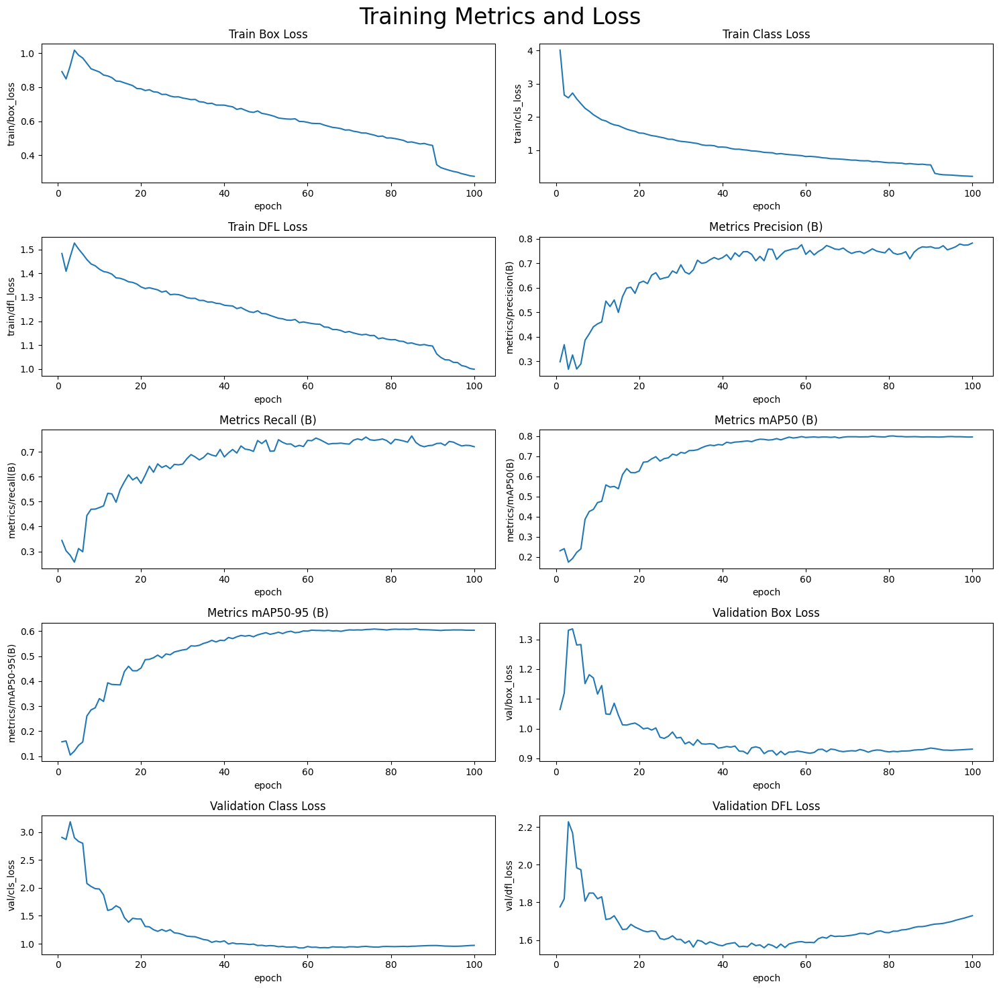

In [30]:
%matplotlib inline
# read in the results.csv file as a pandas dataframe
df = pd.read_csv('/kaggle/working/runs/detect/train/results.csv')
df.columns = df.columns.str.strip()

# create subplots using seaborn
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

# plot the columns using seaborn
sns.lineplot(x='epoch', y='train/box_loss', data=df, ax=axs[0,0])
sns.lineplot(x='epoch', y='train/cls_loss', data=df, ax=axs[0,1])
sns.lineplot(x='epoch', y='train/dfl_loss', data=df, ax=axs[1,0])
sns.lineplot(x='epoch', y='metrics/precision(B)', data=df, ax=axs[1,1])
sns.lineplot(x='epoch', y='metrics/recall(B)', data=df, ax=axs[2,0])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=df, ax=axs[2,1])
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=df, ax=axs[3,0])
sns.lineplot(x='epoch', y='val/box_loss', data=df, ax=axs[3,1])
sns.lineplot(x='epoch', y='val/cls_loss', data=df, ax=axs[4,0])
sns.lineplot(x='epoch', y='val/dfl_loss', data=df, ax=axs[4,1])

# set titles and axis labels for each subplot
axs[0,0].set(title='Train Box Loss')
axs[0,1].set(title='Train Class Loss')
axs[1,0].set(title='Train DFL Loss')
axs[1,1].set(title='Metrics Precision (B)')
axs[2,0].set(title='Metrics Recall (B)')
axs[2,1].set(title='Metrics mAP50 (B)')
axs[3,0].set(title='Metrics mAP50-95 (B)')
axs[3,1].set(title='Validation Box Loss')
axs[4,0].set(title='Validation Class Loss')
axs[4,1].set(title='Validation DFL Loss')

# add suptitle and subheader
plt.suptitle('Training Metrics and Loss', fontsize=24)

# adjust top margin to make space for suptitle
plt.subplots_adjust(top=0.8)

# adjust spacing between subplots
plt.tight_layout()

plt.show()

In [31]:
%matplotlib inline
# Loading the best performing model

model = YOLO('/kaggle/working/runs/detect/train/weights/best.pt')

# Evaluating the model on the test dataset
metrics = model.val(conf = 0.25, split = 'test')

Ultralytics YOLOv8.1.37 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)
Model summary (fused): 218 layers, 25897660 parameters, 0 gradients, 79.0 GFLOPs


val: Scanning /kaggle/working/new_data/test/labels.cache... 1201 images, 0 backgrounds, 5 corrupt: 100%|██████████| 1201/1201 [00:00<?, ?it/s]

val: WARNING ⚠️ /kaggle/working/new_data/test/images/10948.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.2917]
val: WARNING ⚠️ /kaggle/working/new_data/test/images/11244.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0583]
val: WARNING ⚠️ /kaggle/working/new_data/test/images/297.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [       1.07]
val: WARNING ⚠️ /kaggle/working/new_data/test/images/3199.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.3333]
val: WARNING ⚠️ /kaggle/working/new_data/test/images/8421.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.3333]



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 75/75 [00:19<00:00,  3.88it/s]


                   all       1196       1261      0.808      0.769      0.823      0.667
                  rice       1196         16      0.833      0.623       0.71      0.518
          eels on rice       1196         12          1          1      0.995      0.873
                 pilaf       1196          9      0.622      0.889      0.901      0.814
chicken-'n'-egg on rice       1196          8      0.685      0.625      0.705      0.676
   pork cutlet on rice       1196         16        0.8          1      0.976      0.852
            beef curry       1196         16      0.875      0.938      0.983      0.914
                 sushi       1196         11      0.829      0.882      0.928       0.75
          chicken rice       1196          7      0.868      0.942      0.978      0.766
            fried rice       1196         18       0.93      0.735      0.864      0.682
          tempura bowl       1196         11      0.829      0.882      0.876      0.738
              bibimb

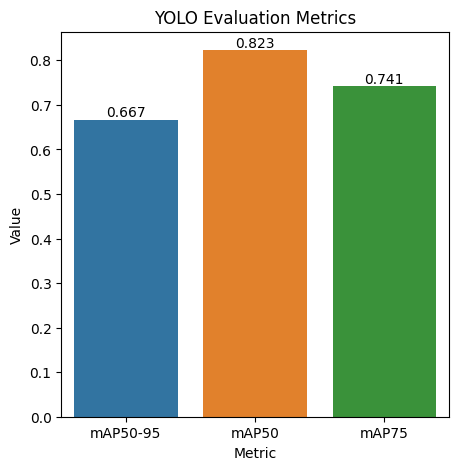

In [34]:
%matplotlib inline
# Create the barplot
ax = sns.barplot(x=['mAP50-95', 'mAP50', 'mAP75'], y=[metrics.box.map, metrics.box.map50, metrics.box.map75])

# Set the title and axis labels
ax.set_title('YOLO Evaluation Metrics')
ax.set_xlabel('Metric')
ax.set_ylabel('Value')

# Set the figure size
fig = plt.gcf()
fig.set_size_inches(5, 5)
# fig.set_size_inches(8, 6)

# Add the values on top of the bars
for p in ax.patches:
    ax.annotate('{:.3f}'.format(p.get_height()), (p.get_x() + p.get_width() / 2, p.get_height()), ha='center', va='bottom')

plt.show()


0: 640x640 1 omelet with fried rice, 15.8ms
Speed: 5.5ms preprocess, 15.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 beef bowl, 15.5ms
Speed: 3.4ms preprocess, 15.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 jiaozi, 15.6ms
Speed: 3.0ms preprocess, 15.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 oden, 15.6ms
Speed: 2.8ms preprocess, 15.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 beef noodle, 15.6ms
Speed: 2.8ms preprocess, 15.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 soba noodle, 15.6ms
Speed: 3.3ms preprocess, 15.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 sashimi, 1 green salad, 15.5ms
Speed: 3.2ms preprocess, 15.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 boiled chicken and vegetables, 15.6ms
Speed: 3.2ms preprocess

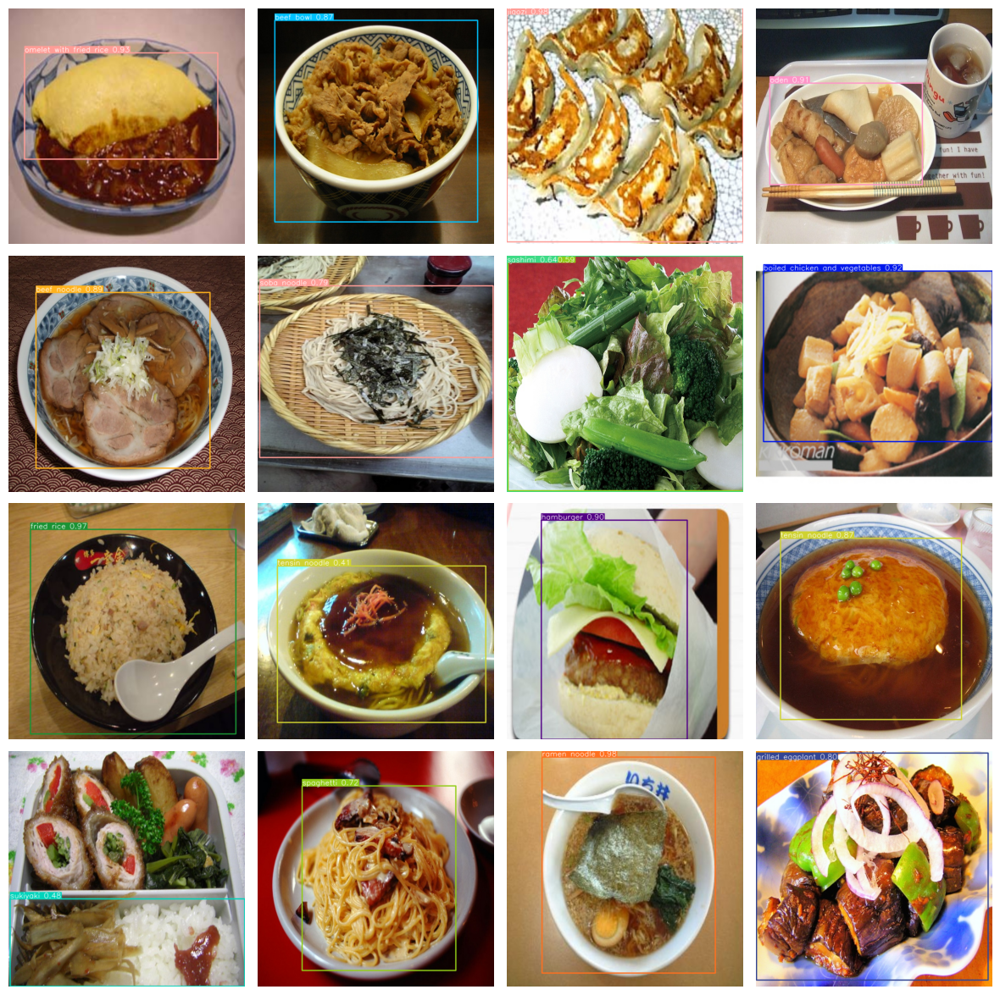

In [33]:
def img_detect(img_path):

    img = cv2.imread(img_path)
    detect_result = model(img)

    detect_img = detect_result[0].plot()
    detect_img = cv2.cvtColor(detect_img, cv2.COLOR_BGR2RGB)

    return detect_img


custom_image_dir = "/kaggle/working/new_data/test/images"

image_files = os.listdir(custom_image_dir)

selected_images = random.sample(image_files, 16)

fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(15, 15))

for i, img_file in enumerate(selected_images):

    row_idx = i // 4
    col_idx = i % 4

    # Load the current image and run object detection
    img_path = os.path.join(custom_image_dir, img_file)
    detect_img = img_detect(img_path)

    # Plot the current image on the appropriate subplot
    axes[row_idx, col_idx].imshow(detect_img)
    axes[row_idx, col_idx].axis('off')

plt.subplots_adjust(wspace=0.05, hspace=0.05)

!yolo task=detect mode=predict model= /kaggle/working/runs/detect/train3/weights/best.pt conf=0.5 source=/kaggle/working/new_data/test/images/6054.jpg

In [ ]:
res=!yolo task=detect mode=predict model=/kaggle/working/runs/detect/train/weights/best.pt conf=0.5 source=/kaggle/working/new_data/test/images/11694.jpg
res

In [ ]:
Image.open("/kaggle/working/new_data/test/images/11694.jpg")

In [ ]:
Image.open("/kaggle/working/runs/detect/predict/11694.jpg")